In [103]:
#import Libraries

import pandas as pd
import numpy as np
import seaborn as sns
import numpy as npy

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

pd.options.mode.chained_assignment = None

# Read in the data

df = pd.read_csv(r'C:\Users\khail\Downloads\movies.csv')

In [144]:
# to look at the data

df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,YearCorrect
0,4090,3,0,2020,5418,6.8,3700,746,1184,1839,8,80000000,461421559,228,149,5418
1,3978,4,1,2020,5417,6.8,42000,294,2091,640,6,135000000,111105497,12,100,5417
2,1153,4,1,2020,5416,5.6,53000,1809,2827,1470,47,175000000,245487753,1397,101,5416
3,3556,4,0,2020,5415,6.5,102000,852,2309,147,47,85000000,319715683,1108,99,5415
4,415,6,0,2020,5414,6.6,140000,16,2390,1812,47,90000000,426505244,452,124,5414


In [105]:
# to see if there is any missing data

for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print ('{} - {}%'.format(col, pct_missing))

name - 0.0%
rating - 0.0%
genre - 0.0%
year - 0.0%
released - 0.0%
score - 0.0%
votes - 0.0%
director - 0.0%
writer - 0.0%
star - 0.0%
country - 0.0%
budget - 0.0%
gross - 0.0%
company - 0.0%
runtime - 0.0%


In [140]:
# there is zero mising data 
# to know what data type are in the colums

df.dtypes

name             int16
rating            int8
genre             int8
year             int64
released         int16
score          float64
votes            int64
director         int16
writer           int16
star             int16
country           int8
budget           int64
gross            int64
company          int16
runtime          int64
YearCorrect     object
dtype: object

In [141]:
# find out there is mistake in the released year
# So create correct year colum to fix it 

df['YearCorrect'] = df['released'].astype(str).str[:4]

df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,YearCorrect
0,4090,3,0,2020,5418,6.8,3700,746,1184,1839,8,80000000,461421559,228,149,5418
1,3978,4,1,2020,5417,6.8,42000,294,2091,640,6,135000000,111105497,12,100,5417
2,1153,4,1,2020,5416,5.6,53000,1809,2827,1470,47,175000000,245487753,1397,101,5416
3,3556,4,0,2020,5415,6.5,102000,852,2309,147,47,85000000,319715683,1108,99,5415
4,415,6,0,2020,5414,6.6,140000,16,2390,1812,47,90000000,426505244,452,124,5414
5,4308,6,6,2020,5413,7.1,186000,1164,1821,498,6,7000000,143151000,1397,124,5413
6,553,6,0,2020,5412,6.1,190000,258,496,1147,47,84500000,201858461,443,109,5412
7,3817,5,0,2020,5411,7.4,387000,317,516,870,47,205000000,363656624,1426,150,5411
8,1799,6,0,2019,5410,3.5,195,1981,162,1613,47,1200000,45696,786,85,5410
9,2543,3,6,2019,5409,6.4,4400,532,866,1699,47,350000,226421,585,83,5409


In [152]:

#Order the data by gross
df =df.sort_values(by=['gross'], inplace=False, ascending=False)

In [153]:
#set to see all of the data in the table 

pd.set_option('display.max_rows', None)

In [145]:
#any duplication should be drop 

#df.drop_dplicates()

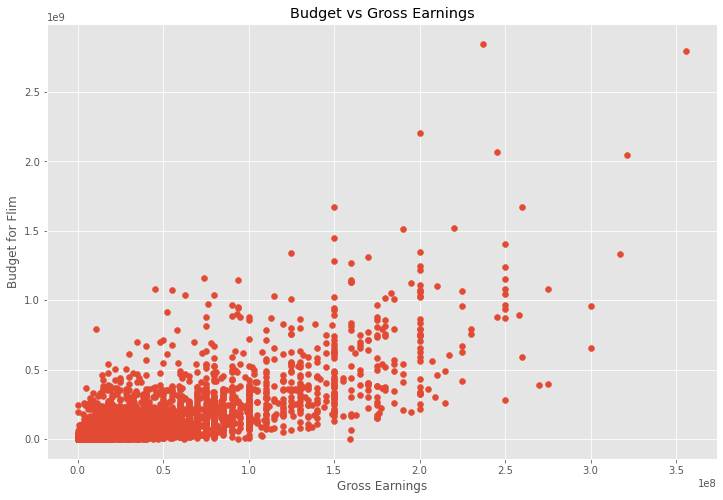

In [117]:
# Scatter plot with budget vs gross

plt.scatter(x=df['budget'], y=df['gross'])

plt.title('Budget vs Gross Earnings')

plt.xlabel ('Gross Earnings')

plt.ylabel ("Budget for Flim")

plt.show()

In [142]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,YearCorrect
0,4090,3,0,2020,5418,6.8,3700,746,1184,1839,8,80000000,461421559,228,149,5418
1,3978,4,1,2020,5417,6.8,42000,294,2091,640,6,135000000,111105497,12,100,5417
2,1153,4,1,2020,5416,5.6,53000,1809,2827,1470,47,175000000,245487753,1397,101,5416
3,3556,4,0,2020,5415,6.5,102000,852,2309,147,47,85000000,319715683,1108,99,5415
4,415,6,0,2020,5414,6.6,140000,16,2390,1812,47,90000000,426505244,452,124,5414


<AxesSubplot:xlabel='budget', ylabel='gross'>

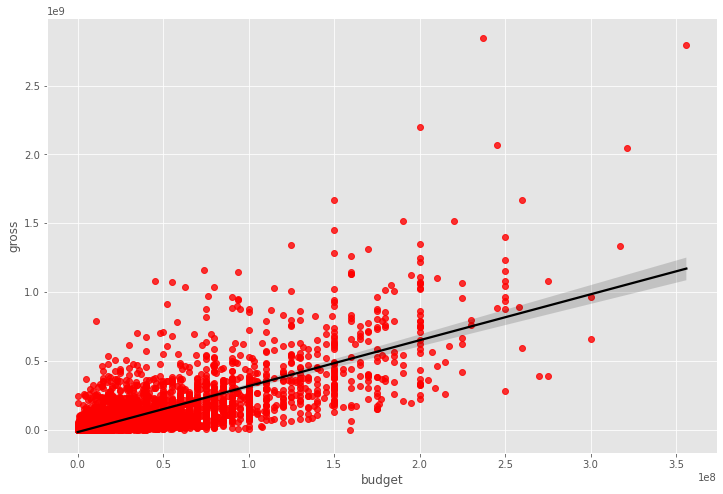

In [125]:
#plot budget vs gross using seaborn

sns.regplot(x='budget', y='gross', data=df, scatter_kws={"color": "red"}, line_kws={"color":"black"})

In [127]:
# let's see if there is any correlation

df.corr(method='pearson')

,year,score,votes,budget,gross,runtime
year,1.000000,0.056386,0.206021,0.327722,0.274321,0.075077
score,0.056386,1.000000,0.474256,0.072001,0.222556,0.414068
votes,0.206021,0.474256,1.000000,0.439675,0.614751,0.352303
budget,0.327722,0.072001,0.439675,1.000000,0.740247,0.318695
gross,0.274321,0.222556,0.614751,0.740247,1.000000,0.275796
runtime,0.075077,0.414068,0.352303,0.318695,0.275796,1.000000


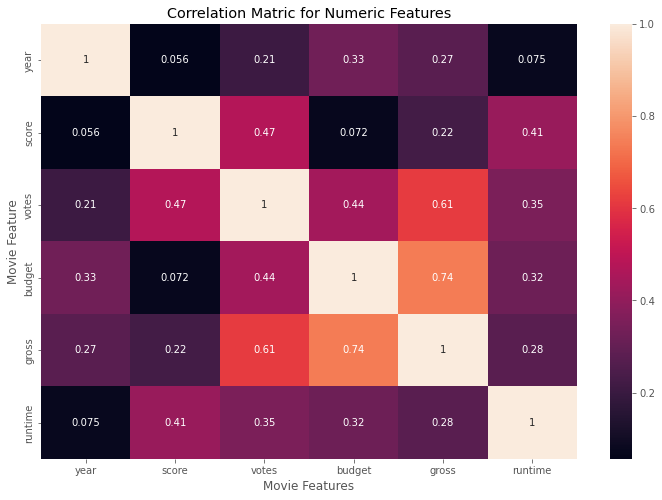

In [130]:
#there is a high correlation between gross and budget 

correlation_matrix= df.corr(method='pearson')
sns.heatmap(correlation_matrix, annot=True)
plt.title('Correlation Matric for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Feature')

plt.show()

In [147]:
#count the number of company 

df_numerized = df

for col_name in df_numerized.columns:
    if(df_numerized[col_name].dtype == 'object'):
        df_numerized[col_name] = df_numerized[col_name].astype('category')
        df_numerized[col_name] = df_numerized[col_name].cat.codes

df_numerized

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,YearCorrect
0,4090,3,0,2020,5418,6.8,3700,746,1184,1839,8,80000000,461421559,228,149,4911
1,3978,4,1,2020,5417,6.8,42000,294,2091,640,6,135000000,111105497,12,100,4910
2,1153,4,1,2020,5416,5.6,53000,1809,2827,1470,47,175000000,245487753,1397,101,4909
3,3556,4,0,2020,5415,6.5,102000,852,2309,147,47,85000000,319715683,1108,99,4908
4,415,6,0,2020,5414,6.6,140000,16,2390,1812,47,90000000,426505244,452,124,4907
5,4308,6,6,2020,5413,7.1,186000,1164,1821,498,6,7000000,143151000,1397,124,4906
6,553,6,0,2020,5412,6.1,190000,258,496,1147,47,84500000,201858461,443,109,4905
7,3817,5,0,2020,5411,7.4,387000,317,516,870,47,205000000,363656624,1426,150,4904
8,1799,6,0,2019,5410,3.5,195,1981,162,1613,47,1200000,45696,786,85,4903
9,2543,3,6,2019,5409,6.4,4400,532,866,1699,47,350000,226421,585,83,4901


In [154]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,YearCorrect
1689,386,5,0,2009,3731,7.8,1100000,785,1263,1534,47,237000000,2847246203,1382,162,3037
118,388,5,0,2019,5300,8.4,903000,105,513,1470,47,356000000,2797501328,983,181,4781
3625,4909,5,6,1997,1795,7.8,1100000,785,1263,1073,47,200000000,2201647264,1382,194,885
690,3643,5,0,2015,4728,7.8,876000,768,1806,356,47,245000000,2069521700,945,138,4144
262,389,5,0,2018,5156,8.4,897000,105,513,1470,47,321000000,2048359754,983,149,4620
86,4388,4,2,2019,5332,6.9,222000,1012,1361,457,47,260000000,1670727580,1423,118,4816
700,2117,5,0,2015,4718,7.0,593000,335,2523,293,47,150000000,1670516444,1397,124,4133
1196,3878,5,0,2012,4222,8.0,1300000,1060,1646,1470,47,220000000,1518815515,983,143,3583
707,1541,5,0,2015,4711,7.1,370000,809,481,1785,47,190000000,1515341399,1397,137,4126
74,1530,4,2,2019,5344,6.8,148000,277,1383,1036,47,150000000,1450026933,1422,103,4829


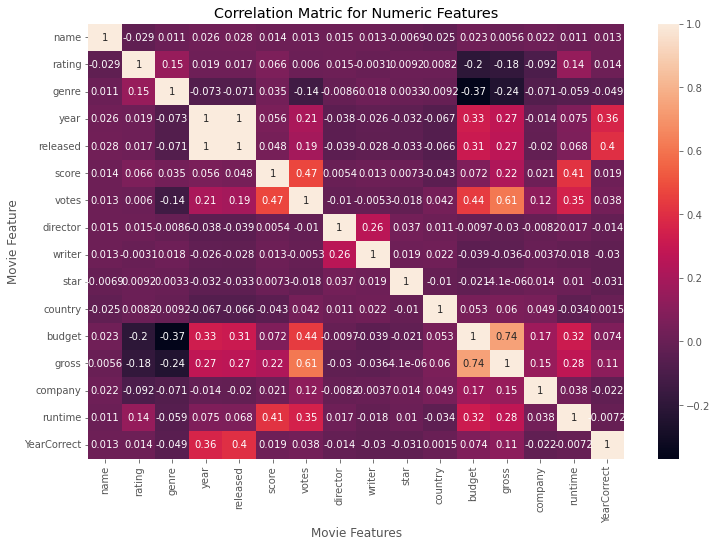

In [149]:
correlation_matrix= df_numerized.corr(method='pearson')
sns.heatmap(correlation_matrix, annot=True)
plt.title('Correlation Matric for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Feature')

plt.show()

In [155]:
df_numerized.corr()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,YearCorrect
name,1.000000,-0.029234,0.010996,0.025542,0.027583,0.014450,0.012615,0.015246,0.012880,-0.006882,-0.025490,0.023392,0.005639,0.021697,0.010850,0.012649
rating,-0.029234,1.000000,0.147796,0.019499,0.016518,0.065983,0.006031,0.014656,-0.003149,0.009196,0.008230,-0.203946,-0.181906,-0.092357,0.140792,0.013736
genre,0.010996,0.147796,1.000000,-0.073167,-0.070905,0.035106,-0.135990,-0.008553,0.017578,0.003341,-0.009164,-0.368523,-0.244101,-0.071334,-0.059237,-0.049243
year,0.025542,0.019499,-0.073167,1.000000,0.996417,0.056386,0.206021,-0.038354,-0.025908,-0.032157,-0.066748,0.327722,0.274321,-0.014333,0.075077,0.361443
released,0.027583,0.016518,-0.070905,0.996417,1.000000,0.048213,0.190406,-0.038691,-0.028101,-0.033276,-0.066465,0.314773,0.265678,-0.020164,0.067754,0.402828
score,0.014450,0.065983,0.035106,0.056386,0.048213,1.000000,0.474256,0.005413,0.012843,0.007296,-0.043051,0.072001,0.222556,0.020656,0.414068,0.018988
votes,0.012615,0.006031,-0.135990,0.206021,0.190406,0.474256,1.000000,-0.010376,-0.005316,-0.017638,0.041551,0.439675,0.614751,0.118470,0.352303,0.037724
director,0.015246,0.014656,-0.008553,-0.038354,-0.038691,0.005413,-0.010376,1.000000,0.261735,0.036593,0.011133,-0.009662,-0.029560,-0.008223,0.017433,-0.013658
writer,0.012880,-0.003149,0.017578,-0.025908,-0.028101,0.012843,-0.005316,0.261735,1.000000,0.018520,0.022488,-0.039466,-0.035885,-0.003697,-0.017561,-0.030488
star,-0.006882,0.009196,0.003341,-0.032157,-0.033276,0.007296,-0.017638,0.036593,0.018520,1.000000,-0.009990,-0.021473,-0.000004,0.014082,0.010108,-0.030773


In [156]:
correlation_mat = df_numerized.corr()

corr_pairs = correlation_mat.unstack()

corr_pairs

name         name           1.000000
             rating        -0.029234
             genre          0.010996
             year           0.025542
             released       0.027583
             score          0.014450
             votes          0.012615
             director       0.015246
             writer         0.012880
             star          -0.006882
             country       -0.025490
             budget         0.023392
             gross          0.005639
             company        0.021697
             runtime        0.010850
             YearCorrect    0.012649
rating       name          -0.029234
             rating         1.000000
             genre          0.147796
             year           0.019499
             released       0.016518
             score          0.065983
             votes          0.006031
             director       0.014656
             writer        -0.003149
             star           0.009196
             country        0.008230
 

In [157]:
#create a sort for the table 

sorted_pairs = corr_pairs.sort_values()

sorted_pairs

budget       genre         -0.368523
genre        budget        -0.368523
             gross         -0.244101
gross        genre         -0.244101
rating       budget        -0.203946
budget       rating        -0.203946
rating       gross         -0.181906
gross        rating        -0.181906
votes        genre         -0.135990
genre        votes         -0.135990
rating       company       -0.092357
company      rating        -0.092357
year         genre         -0.073167
genre        year          -0.073167
company      genre         -0.071334
genre        company       -0.071334
released     genre         -0.070905
genre        released      -0.070905
year         country       -0.066748
country      year          -0.066748
             released      -0.066465
released     country       -0.066465
genre        runtime       -0.059237
runtime      genre         -0.059237
YearCorrect  genre         -0.049243
genre        YearCorrect   -0.049243
country      score         -0.043051
s

In [159]:
#to see which data has the higest corelations

high_corr = sorted_pairs[(sorted_pairs) > 0.5]

high_corr

votes        gross          0.614751
gross        votes          0.614751
             budget         0.740247
budget       gross          0.740247
year         released       0.996417
released     year           0.996417
name         name           1.000000
company      company        1.000000
gross        gross          1.000000
budget       budget         1.000000
country      country        1.000000
star         star           1.000000
writer       writer         1.000000
director     director       1.000000
votes        votes          1.000000
score        score          1.000000
released     released       1.000000
year         year           1.000000
genre        genre          1.000000
rating       rating         1.000000
runtime      runtime        1.000000
YearCorrect  YearCorrect    1.000000
dtype: float64

In [ ]:
# we can say that votes and budget the highest corrlation to gross earnings
#company has low correlation